In [1]:
import re, pickle, collections, numpy as np, keras, math, operator, pdb

#from gensim.models import word2vec, KeyedVectors
import matplotlib.pyplot as plt
import torch, torch.nn as nn
from torch.autograd import Variable
from torch import optim
from torchvision.models import inception_v3
import torch.nn.functional as F
from keras.preprocessing.sequence import pad_sequences
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.autograd import Variable
import re
from os import path
from glob import glob
from torch.utils.data import DataLoader
from PIL import Image
from utils import *
from encoder import *
from gru_decoder import *
FLOAT_DTYPE = torch.cuda.FloatTensor
LONG_DTYPE = torch.cuda.LongTensor

%load_ext autoreload
%autoreload 2
%matplotlib inline


Using Theano backend.
WARNING (theano.sandbox.cuda): The cuda backend is deprecated and will be removed in the next release (v0.10).  Please switch to the gpuarray backend. You can get more information about how to switch at this URL:
 https://github.com/Theano/Theano/wiki/Converting-to-the-new-gpu-back-end%28gpuarray%29

Using gpu device 0: Tesla K80 (CNMeM is disabled, cuDNN Mixed dnn version. The header is from one version, but we link with a different version (5103, 6021))
/home/ubuntu/anaconda2/envs/py36/lib/python3.6/site-packages/torchvision-0.2.0-py3.6.egg/torchvision/transforms/transforms.py:156: UserWarning: The use of the transforms.Scale transform is deprecated, please use transforms.Resize instead.


In [2]:
dpath = 'flikr8/'
imgpath =  'flikr8/Flicker8k_Dataset/' 
tr_img_path = imgpath +'train/'
embed_path = 'glove.6B.300d.txt'
BATCH_SIZE=32
MAX_LEN=30
EMBED_SIZE=300
NUM_DEC_LAYERS=2

In [3]:
dev_caps = pickle.load(open(dpath+'dev_first_caps.pkl', 'rb'))
tr_caps = pickle.load(open(dpath+'train_first_caps.pkl', 'rb'))
tr_ids = pickle.load(open(dpath+'tr_ids.pkl', 'rb'))
dev_ids = pickle.load(open(dpath+'dev_ids.pkl', 'rb'))
w2id = pickle.load(open(dpath+'w2id.pkl', 'rb'))
tr_name_ids = pickle.load(open(dpath+'tr_name_ids_dict.pkl', 'rb'))
tr_names = list(tr_name_ids.keys())
dev_name_ids = pickle.load(open(dpath+'dev_name_ids_dict.pkl', 'rb'))
id2w = pickle.load(open(dpath+'id2w.pkl', 'rb'))
emb_mat = pickle.load(open(dpath+'emb_mat_300.pkl', 'rb'))

In [4]:
tr_caps[0], dev_caps[0]

(('1000268201_693b08cb0e.jpg',
  'A child in a pink dress is climbing up a set of stairs in an entry way .'),
 ('1022454332_6af2c1449a.jpg',
  'A child and a woman are at waters edge in a big city .'))

a child in a pink dress is climbing up a set of stairs in an entry way .


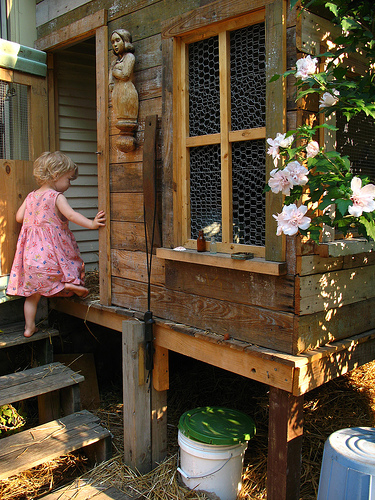

In [5]:
print(turnId2W(tr_name_ids[tr_names[0]], id2w))
Image.open(tr_img_path+'wrap/'+ tr_names[0])

## Train

In [6]:
enc = Encoder(batch_size=BATCH_SIZE,emb_size=EMBED_SIZE)
dec = GruDecoder(emb_mat, batch_size=BATCH_SIZE)
if FLOAT_DTYPE == torch.cuda.FloatTensor:
    enc.cuda()
    dec.cuda()
enc_opt=torch.optim.Adam(filter(lambda p: p.requires_grad, enc.parameters()), lr=0.0001) 
dec_opt=torch.optim.Adam(filter(lambda p: p.requires_grad, dec.parameters()), lr=0.0001)

In [7]:
def trainFor(enc, enc_opt, dec, dec_opt, tr_dl, tr_name_ids, dev_dl, dev_name_ids, id2w, val_every=1, epochs=10000, loss_dict={}):
    num_tr_steps = len(tr_dl.dataset.imgs) // enc.batch_size
    num_dev_steps = len(dev_dl.dataset.imgs) // enc.batch_size
    for epoch in range(epochs):
        gen = ImgCapLoader(tr_dl, tr_name_ids)
        loss = trainEpoch(gen, enc, enc_opt, dec, dec_opt, num_tr_steps, id2w=id2w)
        print('epoch {} avg. tr loss: {}'.format(epoch, loss))
        loss_dict['tr'].append(loss)
        if (epoch + 1) % val_every == 0:
            enc.cnn.eval()
            print('Validating at epoch {}'.format(epoch))
            gen_tr_val = ImgCapLoader(tr_dl, tr_name_ids)
            tr_val_loss = valEpoch(gen_tr_val, enc, dec, num_tr_steps)
            print('epoch {} avg. tr loss, no teacher forching: {}'.format(epoch, tr_val_loss))
            loss_dict['tr_val'].append(tr_val_loss)
            gen_dev_val = ImgCapLoader(dev_dl, dev_name_ids)
            dev_val_loss = valEpoch(gen_dev_val, enc, dec, num_dev_steps )
            print('epoch {} avg. dev loss, no teacher forching: {}'.format(epoch, dev_val_loss))
            loss_dict['dev_val'].append(dev_val_loss)
            preds, trues, imgs = getCapImg(enc, dec, tr_dl, tr_name_ids, batch_size=enc.batch_size)
            displayCapImg(preds, trues, imgs, id2w)
            enc.cnn.train()
            torch.save(enc.state_dict(), 'models/enc_gru_tm1_2.pt')
            torch.save(dec.state_dict(), 'models/dec_gru_tm1_2.pt')
            torch.save(enc_opt.state_dict(), 'models/enc_opt_gru_tm1_2.pt')
            torch.save(dec_opt.state_dict(), 'models/dec_opt_gru_tm1_2.pt')
            pickle.dump(loss_dict, open('models/enc_gru_tm1_prog_dict_2.pkl', 'wb'))

    
def step(loss, enc_opt, dec_opt):
    loss.backward()
    enc_opt.step()
    dec_opt.step()

    
            
def trainEpoch(loader, enc, enc_opt, dec, dec_opt, num_steps, id2w, crit=nn.NLLLoss(), print_prog=True):
    tot_loss = 0.0
    for i, (imgs, ids) in enumerate(loader):
        if i == (num_steps -1):
            break
        enc_opt.zero_grad; dec_opt.zero_grad()
        loss = 0.0
        targ_len = ids.shape[1]
        ids = Variable(torch.LongTensor(ids)).type(LONG_DTYPE)
        hidden = Variable(torch.zeros(dec.num_layers, dec.batch_size, enc.emb_size)).type(FLOAT_DTYPE)
        tm1 = enc(Variable(imgs).type(FLOAT_DTYPE)).unsqueeze(0)
        _, hidden = dec(tm1, hidden, True)
        dec_input = long_t([SOS]*imgs.size()[0]).type(LONG_DTYPE)
        for di in range(targ_len):
            dec_output, hidden = dec(dec_input, hidden) #get output hidden
            dec_input = ids[:, di] #next decoder input (teacher forcing)
            
            loss += crit(dec_output, dec_input) #compute loss
        
        if print_prog and (i + 1) % 50 == 0:
            print('step {} loss: {}'.format(i,loss.data[0]))
        
        step(loss, enc_opt, dec_opt)
        tot_loss += loss.data[0]
    return tot_loss / (num_steps - 1)


def valEpoch(loader, enc, dec, num_steps, crit=nn.NLLLoss()):
    tot_loss = 0.0
    for i, (imgs, ids) in enumerate(loader):
        if i ==  (num_steps -1):
            break
        loss = 0.0
        targ_len = ids.shape[1]
        ids = Variable(torch.LongTensor(ids)).type(LONG_DTYPE)
        hidden = Variable(torch.zeros(dec.num_layers, dec.batch_size, enc.emb_size)).type(FLOAT_DTYPE)
        tm1 = enc(Variable(imgs).type(FLOAT_DTYPE)).unsqueeze(0)
        _, hidden = dec(tm1, hidden, True)
        dec_input = long_t([SOS]*imgs.size()[0]).type(LONG_DTYPE)
        for di in range(targ_len):
            dec_output, hidden = dec(dec_input, hidden)
            _, dec_input = dec_output.topk(1)            
            dec_input = dec_input.squeeze(1)
            loss += crit(dec_output, ids[:, di]) #compute loss
        
        tot_loss += loss.data[0]
    return tot_loss / (num_steps - 1)


def getCapImg(enc, dec, img_dl, name_ids, batch_size=BATCH_SIZE):
    loader = ImgCapLoader(img_dl, name_ids, shuffle=True, batch_size=batch_size)  
    for imgs, ids in loader:
        outs = []
        targ_len = ids.shape[1]
        ids = Variable(torch.LongTensor(ids)).type(LONG_DTYPE)
        hidden = Variable(torch.zeros(dec.num_layers, dec.batch_size, enc.emb_size)).type(FLOAT_DTYPE)
        tm1 = enc(Variable(imgs).type(FLOAT_DTYPE)).unsqueeze(0)
        _, hidden = dec(tm1, hidden, True)
        dec_input = long_t([SOS]*imgs.size()[0]).type(LONG_DTYPE)   
        for di in range(targ_len):
            dec_output, hidden = dec(dec_input, hidden)
            _, dec_input = dec_output.topk(1)            
            dec_input = dec_input.squeeze(1)
            outs.append(dec_input.data.cpu().numpy())
        break
        
    return np.vstack(outs).T, ids.data.cpu().numpy(), imgs




In [8]:
tr_ds = ImageFolder(imgpath+'train/', transform=preproc)
tr_dl = DataLoader(tr_ds,batch_size=BATCH_SIZE)
dev_ds = ImageFolder(imgpath+'dev/', transform=preproc)
dev_dl = DataLoader(dev_ds,batch_size=BATCH_SIZE)

/home/ubuntu/nbs/gru_decoder.py:50: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.log_softmax(self.out(x.squeeze(0))), hidden


step 49 loss: 103.91828918457031
step 99 loss: 76.17867279052734
step 149 loss: 70.57424926757812
epoch 0 avg. tr loss: 106.2130146641885
step 49 loss: 67.99761962890625
step 99 loss: 61.44805908203125
step 149 loss: 56.79349899291992
epoch 1 avg. tr loss: 66.35713841838222
step 49 loss: 67.60848236083984
step 99 loss: 62.56782150268555
step 149 loss: 59.56352233886719
epoch 2 avg. tr loss: 62.799106126190516
step 49 loss: 60.247276306152344
step 99 loss: 54.587093353271484
step 149 loss: 61.615177154541016
epoch 3 avg. tr loss: 59.40012917467343
step 49 loss: 57.40800094604492
step 99 loss: 52.9889030456543
step 149 loss: 55.17171859741211
epoch 4 avg. tr loss: 56.14789673589891
step 49 loss: 60.84182357788086
step 99 loss: 49.02311325073242
step 149 loss: 59.728416442871094
epoch 5 avg. tr loss: 53.59847856337024
step 49 loss: 54.77764129638672
step 99 loss: 52.69454574584961
step 149 loss: 55.13663864135742
epoch 6 avg. tr loss: 51.75080890040244
Validating at epoch 6
epoch 6 avg. t

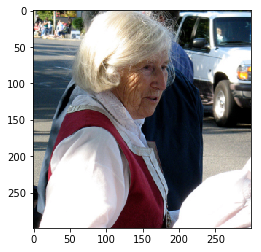

true cap: a girl in a red and white dress is playing with hula hoops . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is is in a red shirt and a white dog in a red shirt . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


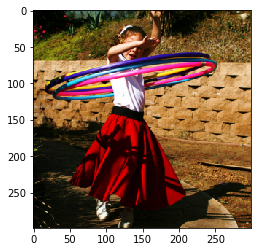

true cap: a group of boys play flag football while some bystanders watch . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is is in a red shirt and a white dog in a red shirt . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


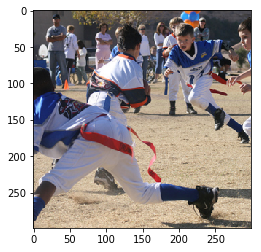

true cap: a girl kicks a ball <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is is in a red shirt and a white dog in a red shirt . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


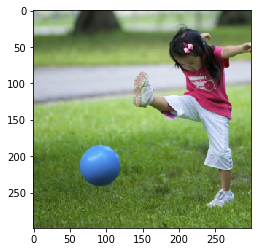

true cap: asian boys play on a raft in a lake <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is is in a red shirt and a white dog in a red shirt . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


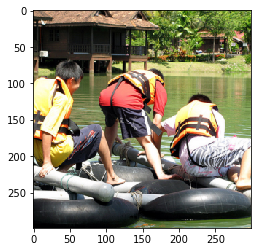

step 49 loss: 53.62690734863281
step 99 loss: 46.7650032043457
step 149 loss: 50.00421142578125
epoch 7 avg. tr loss: 50.180430709674795
step 49 loss: 47.60805892944336
step 99 loss: 48.16650390625
step 149 loss: 42.2841911315918
epoch 8 avg. tr loss: 48.99931977384834
step 49 loss: 43.41970443725586
step 99 loss: 51.9757080078125
step 149 loss: 49.23961639404297
epoch 9 avg. tr loss: 47.9781497422085
step 49 loss: 43.65724182128906
step 99 loss: 52.6639289855957
step 149 loss: 44.35047912597656
epoch 10 avg. tr loss: 47.1435607376919
step 49 loss: 41.507240295410156
step 99 loss: 44.685115814208984
step 149 loss: 46.90272521972656
epoch 11 avg. tr loss: 46.368216914515344
step 49 loss: 43.515174865722656
step 99 loss: 48.700077056884766
step 149 loss: 43.59938430786133
epoch 12 avg. tr loss: 45.65422642615534
step 49 loss: 46.01825714111328
step 99 loss: 41.69729995727539
step 149 loss: 48.81908416748047
epoch 13 avg. tr loss: 45.026678269909276
Validating at epoch 13
epoch 13 avg. tr

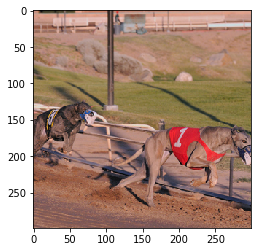

true cap: two persons in midair snowboarding . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is running on a field . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


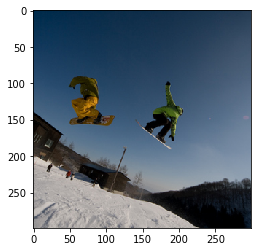

true cap: two dogs fight next to rocks <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is running on a field . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


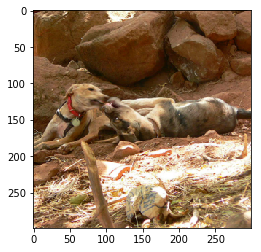

true cap: a basketball player in blue is attempting to block a player in white during a game . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is running on a field . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


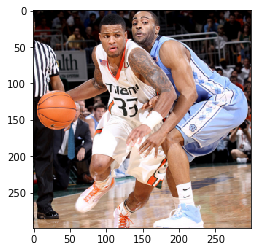

true cap: a kayaker kayaks through the water . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is running on a field . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


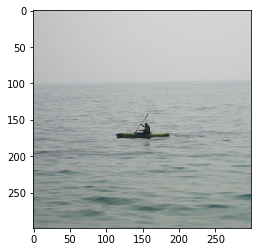

step 49 loss: 39.77984619140625
step 99 loss: 41.80149841308594
step 149 loss: 50.469852447509766
epoch 14 avg. tr loss: 44.456803188529065
step 49 loss: 43.86045837402344
step 99 loss: 45.842308044433594
step 149 loss: 46.27510070800781
epoch 15 avg. tr loss: 43.77629271886682
step 49 loss: 45.793617248535156
step 99 loss: 47.15866470336914
step 149 loss: 45.309478759765625
epoch 16 avg. tr loss: 43.22979685055312
step 49 loss: 42.000762939453125
step 99 loss: 43.65364074707031
step 149 loss: 41.72542190551758
epoch 17 avg. tr loss: 42.62245791445496
step 49 loss: 43.761016845703125
step 99 loss: 44.51744842529297
step 149 loss: 41.70317077636719
epoch 18 avg. tr loss: 42.1725646603492
step 49 loss: 40.31486892700195
step 99 loss: 36.27799606323242
step 149 loss: 45.47549819946289
epoch 19 avg. tr loss: 41.69693140829763
step 49 loss: 40.01042175292969
step 99 loss: 42.08161544799805
step 149 loss: 42.349693298339844
epoch 20 avg. tr loss: 41.27852232738208
Validating at epoch 20
epoc

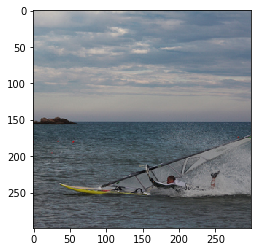

true cap: an elderly woman crosses the road in a city . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is standing on a red and white and white dog . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


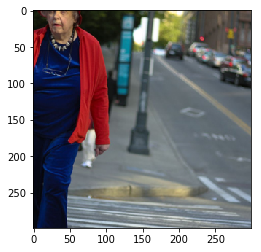

true cap: a hiker is posing in front of snowy mountains . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is standing on a red and white and white dog . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


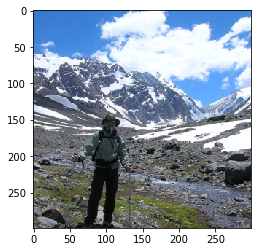

true cap: a small boat carrying two people moves through the water . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is standing on a red and white and white dog . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


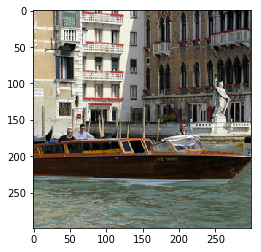

true cap: a brown dog digs in the sand happily . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a black and white dog is running through the water . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


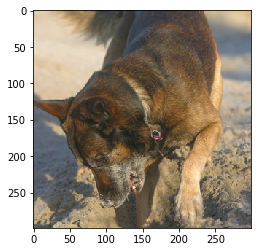

step 49 loss: 43.14280700683594
step 99 loss: 44.436431884765625
step 149 loss: 33.9713134765625
epoch 21 avg. tr loss: 40.85056487462854
step 49 loss: 38.15611267089844
step 99 loss: 48.73625183105469
step 149 loss: 43.695213317871094
epoch 22 avg. tr loss: 40.448533376057945
step 49 loss: 37.83060073852539
step 99 loss: 44.65956115722656
step 149 loss: 40.56328201293945
epoch 23 avg. tr loss: 40.05629425664102
step 49 loss: 34.39647674560547
step 99 loss: 40.22386169433594
step 149 loss: 39.65127182006836
epoch 24 avg. tr loss: 39.74801061486685
step 49 loss: 38.029541015625
step 99 loss: 34.632564544677734
step 149 loss: 37.4730339050293
epoch 25 avg. tr loss: 39.3845483410743
step 49 loss: 44.25342559814453
step 99 loss: 37.505611419677734
step 149 loss: 40.734092712402344
epoch 26 avg. tr loss: 39.04644958947294
step 49 loss: 35.82151412963867
step 99 loss: 35.722991943359375
step 149 loss: 37.379241943359375
epoch 27 avg. tr loss: 38.66615844029252
Validating at epoch 27
epoch 27

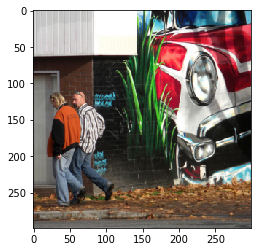

true cap: a group of race buggies travel down a racetrack . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is standing on a rock . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


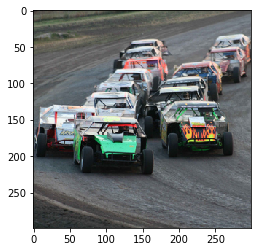

true cap: a blond dog jumps in the air on the grass . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a brown dog is running through the water . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


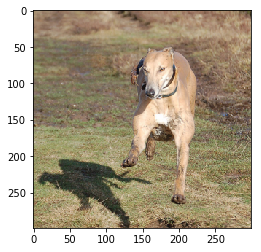

true cap: a skateboarder in flannel rides his skateboard to the top of a ramp . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is standing on a rock . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


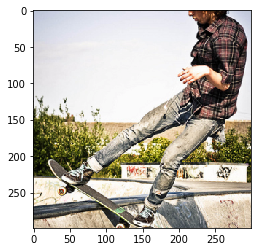

true cap: a man is sitting on the sidewalk by a tree . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is standing on a rock . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


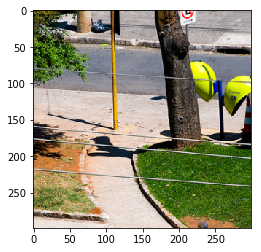

step 49 loss: 38.508323669433594
step 99 loss: 40.53252410888672
step 149 loss: 36.381988525390625
epoch 28 avg. tr loss: 38.4017157400808
step 49 loss: 40.58280563354492
step 99 loss: 40.408058166503906
step 149 loss: 40.990806579589844
epoch 29 avg. tr loss: 38.09543517328078
step 49 loss: 38.06875991821289
step 99 loss: 37.96156692504883
step 149 loss: 39.57374954223633
epoch 30 avg. tr loss: 37.76355742382747
step 49 loss: 37.273048400878906
step 99 loss: 37.985023498535156
step 149 loss: 34.30805587768555
epoch 31 avg. tr loss: 37.45480295406875
step 49 loss: 36.903076171875
step 99 loss: 40.84832000732422
step 149 loss: 35.9970817565918
epoch 32 avg. tr loss: 37.203207077518584
step 49 loss: 37.239891052246094
step 99 loss: 33.07889175415039
step 149 loss: 38.42061233520508
epoch 33 avg. tr loss: 36.86433843387071
step 49 loss: 31.583415985107422
step 99 loss: 40.561134338378906
step 149 loss: 39.844642639160156
epoch 34 avg. tr loss: 36.58205317425472
Validating at epoch 34
epoc

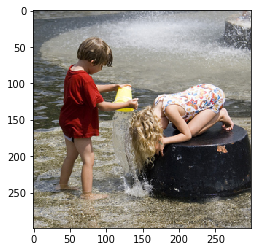

true cap: a child in a red jacket , sitting atop a slide . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is sitting on a rock . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


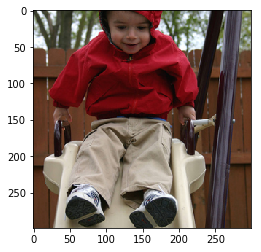

true cap: a boy rides a game machine . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is sitting on a rock . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


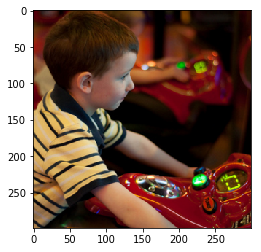

true cap: a girl sits outside at a large fountain . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is sitting on a rock . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


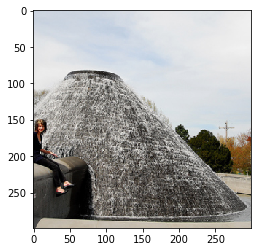

true cap: a climber is making his way up a snowy mountainside . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is sitting on a rock . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


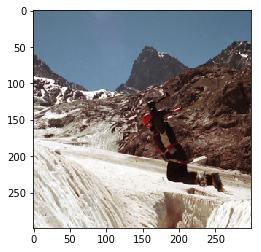

step 49 loss: 40.53612518310547
step 99 loss: 36.70729064941406
step 149 loss: 41.36399841308594
epoch 35 avg. tr loss: 36.35673685996763
step 49 loss: 34.0478515625
step 99 loss: 33.359771728515625
step 149 loss: 34.67876052856445
epoch 36 avg. tr loss: 36.102345938323644
step 49 loss: 38.220909118652344
step 99 loss: 33.41074752807617
step 149 loss: 35.46229553222656
epoch 37 avg. tr loss: 35.79138942431378
step 49 loss: 32.95664978027344
step 99 loss: 37.260841369628906
step 149 loss: 36.446617126464844
epoch 38 avg. tr loss: 35.49113166973155
step 49 loss: 33.22767639160156
step 99 loss: 38.20598602294922
step 149 loss: 33.91790008544922
epoch 39 avg. tr loss: 35.24891899478051
step 49 loss: 30.999622344970703
step 99 loss: 35.54069900512695
step 149 loss: 41.03620147705078
epoch 40 avg. tr loss: 34.987396147943315
step 49 loss: 37.226409912109375
step 99 loss: 41.53366470336914
step 149 loss: 36.7855339050293
epoch 41 avg. tr loss: 34.78741154619443
Validating at epoch 41
epoch 41

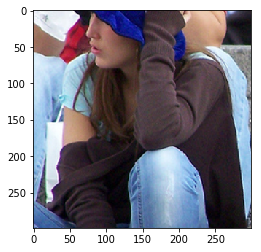

true cap: a border collie jumps over a bed with a tennis ball in its mouth . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a boy in a red shirt is running on a beach . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


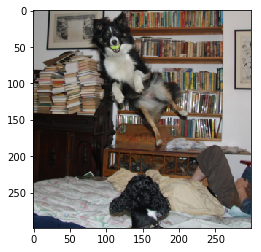

true cap: a man and a boy sitting with their back to a stone wall , the man paying a flute . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is standing on a bench . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


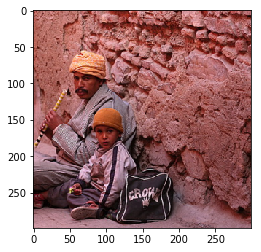

true cap: a baby in a pool splashing water in the air . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a boy in a red shirt is running on a beach . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


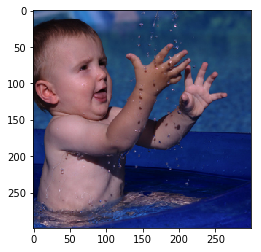

true cap: a boy in a soccer uniform running in a field during a game . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a boy in a red shirt is running on a beach . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


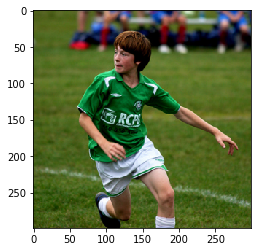

step 49 loss: 32.23455047607422
step 99 loss: 36.10884094238281
step 149 loss: 39.43118667602539
epoch 42 avg. tr loss: 34.50556867866106
step 49 loss: 31.855106353759766
step 99 loss: 36.92531204223633
step 149 loss: 33.10460662841797
epoch 43 avg. tr loss: 34.25543583080333
step 49 loss: 28.956344604492188
step 99 loss: 32.656028747558594
step 149 loss: 34.978450775146484
epoch 44 avg. tr loss: 34.01560820302656
step 49 loss: 31.257356643676758
step 99 loss: 37.95237350463867
step 149 loss: 31.938817977905273
epoch 45 avg. tr loss: 33.75263239747734
step 49 loss: 35.03056335449219
step 99 loss: 32.253841400146484
step 149 loss: 36.86258316040039
epoch 46 avg. tr loss: 33.532727497880174
step 49 loss: 33.084049224853516
step 99 loss: 30.407272338867188
step 149 loss: 29.75209617614746
epoch 47 avg. tr loss: 33.26177986719275
step 49 loss: 38.43893814086914
step 99 loss: 31.930845260620117
step 149 loss: 30.1866455078125
epoch 48 avg. tr loss: 33.05727490045691
Validating at epoch 48
e

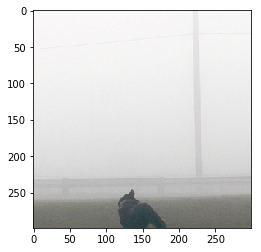

true cap: a group of men lift their arms to signal while they look to the left . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a blue shirt is sitting on a bench . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


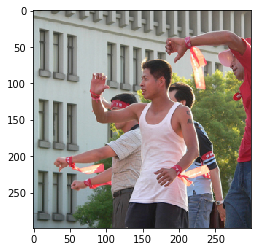

true cap: a little old lady sitting next to an advertisement . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a blue shirt is sitting on a bench . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


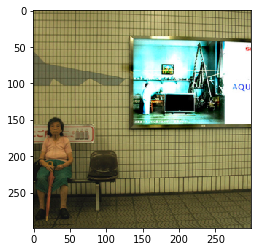

true cap: an older boy chases a laughing younger boy on the grass . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a boy in a red shirt is running on a beach . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


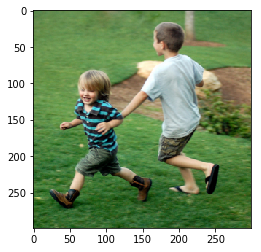

true cap: a woman and two elderly men are standing in front of a speaker . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a blue shirt is sitting on a bench . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


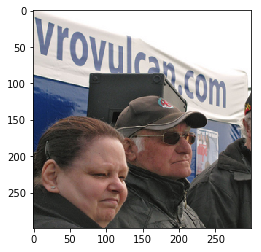

step 49 loss: 34.75349044799805
step 99 loss: 33.278629302978516
step 149 loss: 32.63571548461914
epoch 49 avg. tr loss: 32.76426872130363
step 49 loss: 31.320981979370117
step 99 loss: 35.09337615966797
step 149 loss: 33.993377685546875
epoch 50 avg. tr loss: 32.56745712731474
step 49 loss: 33.05322265625
step 99 loss: 38.171485900878906
step 149 loss: 30.575620651245117
epoch 51 avg. tr loss: 32.325691530781405
step 49 loss: 31.471553802490234
step 99 loss: 31.087116241455078
step 149 loss: 33.10832977294922
epoch 52 avg. tr loss: 32.104550402651554
step 49 loss: 36.428279876708984
step 99 loss: 35.69411087036133
step 149 loss: 29.16603660583496
epoch 53 avg. tr loss: 31.89200803285004
step 49 loss: 31.74468994140625
step 99 loss: 32.861724853515625
step 149 loss: 27.096757888793945
epoch 54 avg. tr loss: 31.64777571155179
step 49 loss: 32.182640075683594
step 99 loss: 27.876022338867188
step 149 loss: 32.629119873046875
epoch 55 avg. tr loss: 31.3809847575362
Validating at epoch 55


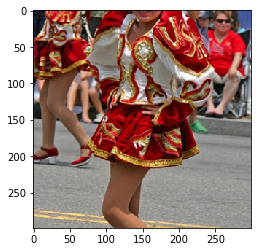

true cap: a dirt biker rounding a bend on a downhill course . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a blue shirt is sitting on a bench . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


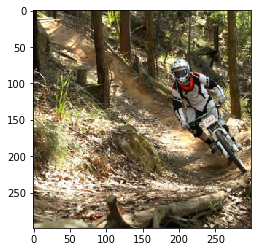

true cap: a blonde woman with her hair up is taking off a white sweatshirt . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a boy in a red shirt is running on a beach . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


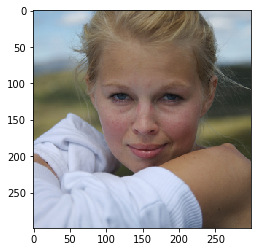

true cap: a female toddler wearing a pink shirt is playing on a playground . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a boy in a red shirt is running on a beach . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


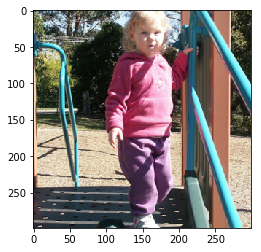

true cap: a man is wearing a black mask and black clothing in a social setting . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a blue shirt is sitting on a bench . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


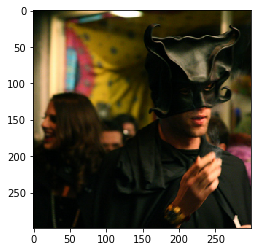

step 49 loss: 28.83359146118164
step 99 loss: 27.99981689453125
step 149 loss: 33.50750732421875
epoch 56 avg. tr loss: 31.15029176076253
step 49 loss: 31.59734344482422
step 99 loss: 32.29237365722656
step 149 loss: 29.65266990661621
epoch 57 avg. tr loss: 30.92426569743823
step 49 loss: 34.588279724121094
step 99 loss: 30.274812698364258
step 149 loss: 27.78476333618164
epoch 58 avg. tr loss: 30.68725799232401
step 49 loss: 31.972145080566406
step 99 loss: 33.17852783203125
step 149 loss: 27.283050537109375
epoch 59 avg. tr loss: 30.491643239093083
step 49 loss: 27.58277702331543
step 99 loss: 27.328704833984375
step 149 loss: 30.248729705810547
epoch 60 avg. tr loss: 30.27724786984023
step 49 loss: 28.04840087890625
step 99 loss: 29.02711296081543
step 149 loss: 29.455095291137695
epoch 61 avg. tr loss: 30.04055332881148
step 49 loss: 29.10555648803711
step 99 loss: 30.589290618896484
step 149 loss: 28.74446678161621
epoch 62 avg. tr loss: 29.792534182148596
Validating at epoch 62
e

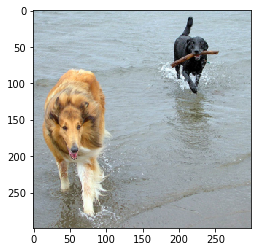

true cap: a girl dancing with four boys watching . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a blue shirt and jeans is sitting on a bench . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


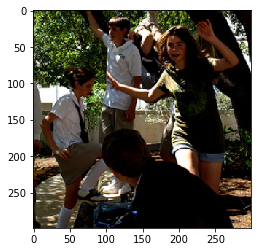

true cap: a guy in red jumping . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a blue shirt and jeans is sitting on a bench . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


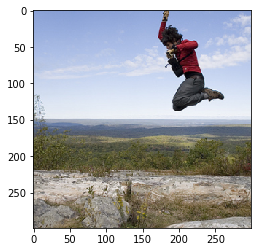

true cap: a brown dog fetching a ball out of the water . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a brown dog is running through the snow . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


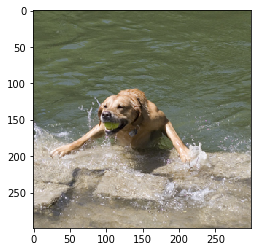

true cap: a bike rider flipping over a black ramp . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a boy in a red shirt is running on a beach . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


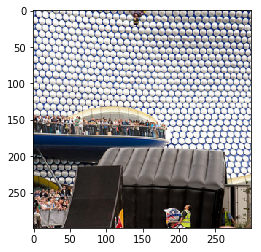

step 49 loss: 26.488903045654297
step 99 loss: 32.47134780883789
step 149 loss: 26.342336654663086
epoch 63 avg. tr loss: 29.59381367057882
step 49 loss: 24.294214248657227
step 99 loss: 29.175683975219727
step 149 loss: 30.862842559814453
epoch 64 avg. tr loss: 29.391105323709468
step 49 loss: 28.774581909179688
step 99 loss: 32.91139602661133
step 149 loss: 29.581764221191406
epoch 65 avg. tr loss: 29.144423505311373
step 49 loss: 29.853782653808594
step 99 loss: 31.909669876098633
step 149 loss: 30.248172760009766
epoch 66 avg. tr loss: 28.917974533573275
step 49 loss: 29.600126266479492
step 99 loss: 30.346038818359375
step 149 loss: 27.150819778442383
epoch 67 avg. tr loss: 28.720296264976582
step 49 loss: 27.706443786621094
step 99 loss: 29.307331085205078
step 149 loss: 28.303281784057617
epoch 68 avg. tr loss: 28.503114341407695
step 49 loss: 28.454448699951172
step 99 loss: 28.007892608642578


KeyboardInterrupt: 

In [9]:
prog_dict = {'tr':[], 'tr_val':[], 'dev_val':[]}
trainFor(enc, 
         enc_opt, 
         dec, 
         dec_opt, 
         tr_dl, 
         tr_name_ids, 
         dev_dl, 
         dev_name_ids, 
         id2w,
         val_every=7, 
         epochs=10000, 
         loss_dict=prog_dict)

In [40]:
enc.load_state_dict(torch.load('models/enc_gru_tm1.pt'))
dec.load_state_dict(torch.load('models/dec_gru_tm1.pt'))
enc_opt.load_state_dict(torch.load('models/enc_opt_gru_tm1.pt'))
dec_opt.load_state_dict(torch.load('models/dec_opt_gru_tm1.pt'))
prog_dict = pickle.load(open('models/enc_gru_tm1_prog_dict.pkl', 'rb'))

/home/ubuntu/nbs/gru_decoder.py:50: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.log_softmax(self.out(x.squeeze(0))), hidden


step 49 loss: 47.43024444580078
step 99 loss: 48.72496795654297
step 149 loss: 39.98308181762695
epoch 0 avg. tr loss: 44.13169075340353
step 49 loss: 38.28266906738281
step 99 loss: 42.107086181640625
step 149 loss: 41.06713104248047
epoch 1 avg. tr loss: 43.54374616889543
step 49 loss: 41.95103073120117
step 99 loss: 42.03474044799805
step 149 loss: 43.290679931640625
epoch 2 avg. tr loss: 42.95017246533466
step 49 loss: 38.86134719848633
step 99 loss: 41.923370361328125
step 149 loss: 44.36185073852539
epoch 3 avg. tr loss: 42.50536149547946
step 49 loss: 42.0565185546875
step 99 loss: 42.44001007080078
step 149 loss: 46.8478889465332
epoch 4 avg. tr loss: 41.979718239076675
step 49 loss: 42.30581283569336
step 99 loss: 45.98373031616211
step 149 loss: 35.01850891113281
epoch 5 avg. tr loss: 41.531986667263894
step 49 loss: 43.62324523925781
step 99 loss: 40.875022888183594
step 149 loss: 37.996280670166016
epoch 6 avg. tr loss: 41.12034670511881
Validating at epoch 6
epoch 6 avg. t

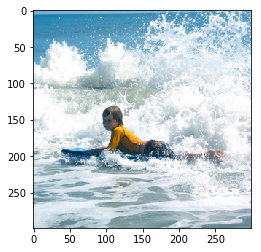

true cap: a male does an open leg trick while doing a wheelie on his bike . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is jumping on a beach . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


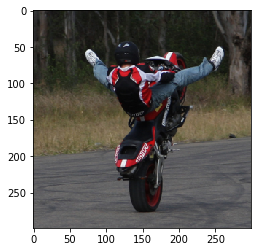

true cap: a football player pauses during a game . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is jumping on a beach . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


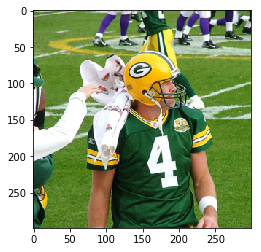

true cap: there are two large dogs running about in a field . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a black dog is running through the water . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


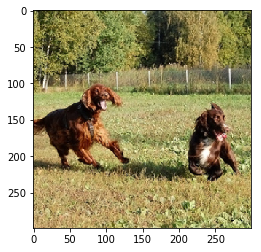

true cap: a grey haired in a wetsuit poised in the water . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is jumping on a beach . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


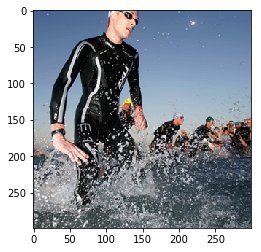

step 49 loss: 37.23997116088867
step 99 loss: 42.171451568603516
step 149 loss: 40.76215362548828
epoch 7 avg. tr loss: 40.78332790251701
step 49 loss: 43.189151763916016
step 99 loss: 38.29866027832031
step 149 loss: 42.970375061035156
epoch 8 avg. tr loss: 40.33902416434339
step 49 loss: 40.358036041259766
step 99 loss: 39.97072982788086
step 149 loss: 40.567710876464844
epoch 9 avg. tr loss: 39.97331756673833
step 49 loss: 39.93048095703125
step 99 loss: 45.67204666137695
step 149 loss: 35.67306900024414
epoch 10 avg. tr loss: 39.649351396868305
step 49 loss: 40.33631896972656
step 99 loss: 38.50055694580078
step 149 loss: 43.304996490478516
epoch 11 avg. tr loss: 39.26816505514165
step 49 loss: 38.37996292114258
step 99 loss: 38.22840118408203
step 149 loss: 44.6144905090332
epoch 12 avg. tr loss: 38.93135764009209
step 49 loss: 37.19099426269531
step 99 loss: 35.057167053222656
step 149 loss: 38.40214157104492
epoch 13 avg. tr loss: 38.61520928208546
Validating at epoch 13
epoch 1

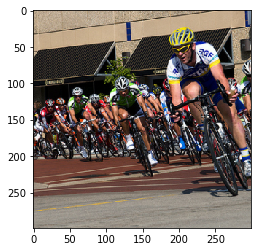

true cap: a girl is outside a house with a pink hula hoop spinning around her upper leg . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is standing on a rock in a field . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


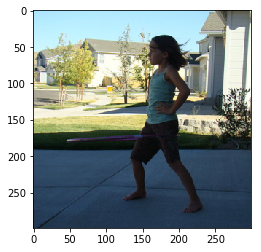

true cap: a girl in a pink swimsuit jumps through a water sprinkler . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is standing on a rock in a field . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


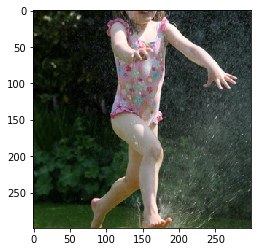

true cap: a dog in a red jacket is running on the grass . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a brown dog is running through the water . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


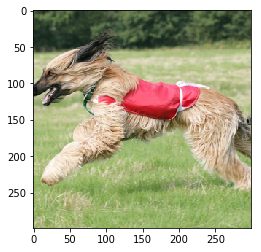

true cap: a black and a brown dog running in the grass . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a brown dog is running through the water . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


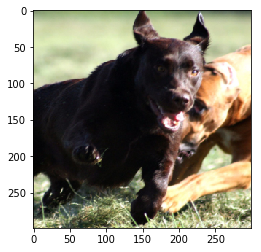

step 49 loss: 39.35725402832031
step 99 loss: 35.92818832397461
step 149 loss: 43.410377502441406
epoch 14 avg. tr loss: 38.26175425129552
step 49 loss: 35.78873825073242
step 99 loss: 34.75817108154297
step 149 loss: 40.266998291015625
epoch 15 avg. tr loss: 38.01080135632587
step 49 loss: 37.428810119628906
step 99 loss: 40.73149871826172
step 149 loss: 40.128692626953125
epoch 16 avg. tr loss: 37.69576073718327
step 49 loss: 37.03704071044922
step 99 loss: 38.751564025878906
step 149 loss: 37.36042404174805
epoch 17 avg. tr loss: 37.39324708138743
step 49 loss: 39.992462158203125
step 99 loss: 39.662052154541016
step 149 loss: 39.017704010009766
epoch 18 avg. tr loss: 37.076884115895915
step 49 loss: 39.895050048828125
step 99 loss: 40.214996337890625
step 149 loss: 39.36494827270508
epoch 19 avg. tr loss: 36.831162001497
step 49 loss: 34.17961120605469
step 99 loss: 36.35136032104492
step 149 loss: 41.164794921875
epoch 20 avg. tr loss: 36.49093043419622
Validating at epoch 20
epoc

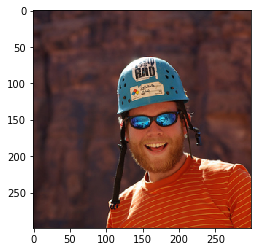

true cap: a brown and white dog is standing on its hind legs reaching for a ball . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a black and white dog is running through the snow . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


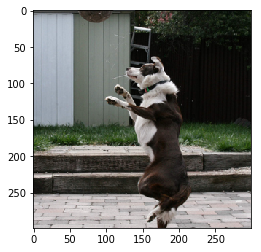

true cap: a pelican flies over the water . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a black and white dog is running through the snow . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


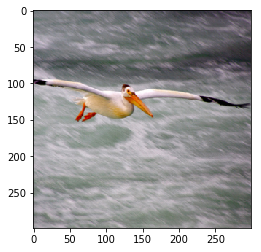

true cap: a girl does the backstroke in the pool . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is standing on a rock in a park . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


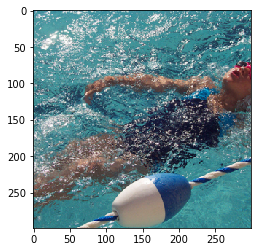

true cap: a girl in a dress holds a tennis racket . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is standing on a rock in a park . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


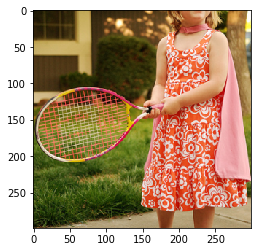

step 49 loss: 40.88246154785156
step 99 loss: 36.59230041503906
step 149 loss: 36.695091247558594
epoch 21 avg. tr loss: 36.23285948845648
step 49 loss: 40.30805969238281
step 99 loss: 27.552377700805664
step 149 loss: 33.4754638671875
epoch 22 avg. tr loss: 35.950494325289164
step 49 loss: 39.38136291503906
step 99 loss: 35.65878677368164
step 149 loss: 38.8809928894043
epoch 23 avg. tr loss: 35.698290260889195
step 49 loss: 34.57794952392578
step 99 loss: 33.70606231689453
step 149 loss: 34.30614471435547
epoch 24 avg. tr loss: 35.44102563140213
step 49 loss: 38.13597869873047
step 99 loss: 36.25300216674805
step 149 loss: 32.92655944824219
epoch 25 avg. tr loss: 35.18714414617067
step 49 loss: 38.558128356933594
step 99 loss: 37.461055755615234
step 149 loss: 35.40313720703125
epoch 26 avg. tr loss: 34.88453885560395
step 49 loss: 35.65050506591797
step 99 loss: 38.814979553222656
step 149 loss: 38.165550231933594
epoch 27 avg. tr loss: 34.65197434989355
Validating at epoch 27
epoch

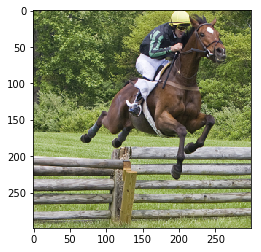

true cap: a group of skiers jumping down slopes with the sun directly cast in backgroud <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is standing on a rock in a park . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


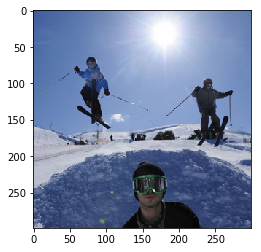

true cap: a brown dog has a purple disc . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a black and white dog is running through the snow . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


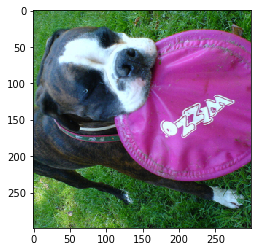

true cap: a man holding a trophy after a race . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is standing on a rock in a park . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


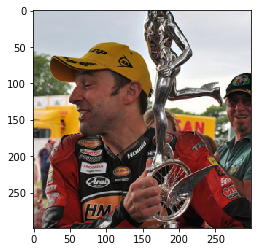

true cap: a dog and his owner at a rocky beach . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is standing on a bench . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


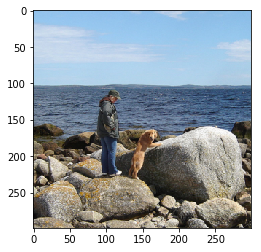

step 49 loss: 36.47194290161133
step 99 loss: 34.331298828125
step 149 loss: 31.728792190551758
epoch 28 avg. tr loss: 34.409044973311886
step 49 loss: 30.9647216796875
step 99 loss: 29.938535690307617
step 149 loss: 35.822208404541016
epoch 29 avg. tr loss: 34.16838867433609
step 49 loss: 34.747398376464844
step 99 loss: 35.638553619384766
step 149 loss: 32.203392028808594
epoch 30 avg. tr loss: 33.87722563999955
step 49 loss: 32.61701202392578
step 99 loss: 33.876487731933594
step 149 loss: 29.86492919921875
epoch 31 avg. tr loss: 33.632184982299805
step 49 loss: 32.99474334716797
step 99 loss: 31.61834144592285
step 149 loss: 34.38182830810547
epoch 32 avg. tr loss: 33.43366483462754
step 49 loss: 34.96062088012695
step 99 loss: 33.513916015625
step 149 loss: 31.381282806396484
epoch 33 avg. tr loss: 33.15162703811482
step 49 loss: 33.32542419433594
step 99 loss: 36.74029541015625
step 149 loss: 33.04991149902344
epoch 34 avg. tr loss: 32.92440931258663
Validating at epoch 34
epoch 

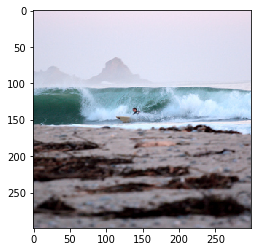

true cap: a man carries two grocery bags , a sign of a funny man is by the pole near him . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is standing on a bench . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


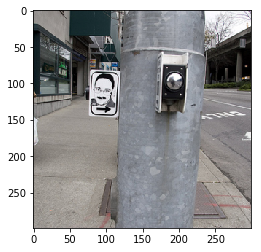

true cap: a child in green shoes is splashing in a puddle . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is standing on a bench . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


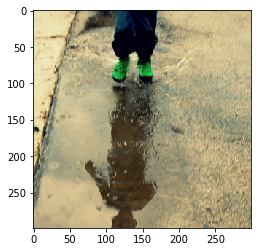

true cap: a mother helps her little boy eat his food by feeding him by hand . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a man in a red shirt is standing on a bench . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


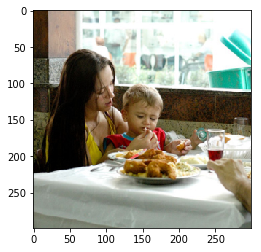

true cap: a black and white dog in a dog shirt carrying a long piece of wood . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
predicted cap: a black and white dog is running through the snow . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>


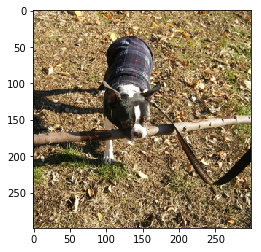

step 49 loss: 33.33740234375
step 99 loss: 31.27980613708496
step 149 loss: 33.53181838989258
epoch 35 avg. tr loss: 32.64501566527992
step 49 loss: 31.386274337768555
step 99 loss: 32.081520080566406
step 149 loss: 29.481983184814453
epoch 36 avg. tr loss: 32.40916963802871
step 49 loss: 29.186450958251953
step 99 loss: 33.46693420410156
step 149 loss: 29.90389060974121
epoch 37 avg. tr loss: 32.20389288215227
step 49 loss: 28.02980613708496
step 99 loss: 34.26874542236328
step 149 loss: 33.24961471557617
epoch 38 avg. tr loss: 31.956045263557023
step 49 loss: 32.658660888671875
step 99 loss: 33.868675231933594
step 149 loss: 29.87360382080078
epoch 39 avg. tr loss: 31.709641589913318
step 49 loss: 30.133852005004883
step 99 loss: 27.460830688476562


KeyboardInterrupt: 

In [41]:
trainFor(enc, 
         enc_opt, 
         dec, 
         dec_opt, 
         tr_dl, 
         tr_name_ids, 
         dev_dl, 
         dev_name_ids,
         id2w,
         val_every=7, 
         epochs=10000, 
         loss_dict=prog_dict)

## Evaluate

In [35]:
enc = Encoder(batch_size=BATCH_SIZE, testing=True)
embs_t = torch.FloatTensor(embs)

dec = Decoder(embs_t, batch_size=BATCH_SIZE, num_layers=NUM_DEC_LAYERS)
enc.load_state_dict(torch.load('models/enc_gru_adam_1.pt'))
dec.load_state_dict(torch.load('models/dec_gru_adam_1.pt'))
if FLOAT_DTYPE == torch.cuda.FloatTensor:
    enc.cuda()
    dec.cuda()

tr_ds = ImageFolder(imgpath+'train/', transform=preproc)
tr_dl = DataLoader(tr_ds,batch_size=BATCH_SIZE)

pred, true, inp = evaluate(enc, dec, tr_dl, name_ids_dict)

/home/ubuntu/anaconda2/envs/py36/lib/python3.6/site-packages/torch/backends/cudnn/__init__.py:40: UserWarning: PyTorch was compiled without cuDNN support. To use cuDNN, rebuild PyTorch making sure the library is visible to the build system.
  "PyTorch was compiled without cuDNN support. To use cuDNN, rebuild "


In [33]:
def evaluate(enc, dec, img_dl, cap_dict, batch_size=BATCH_SIZE):
    loader = ImgCapLoader(img_dl, cap_dict, shuffle=True, batch_size=batch_size)  
    for imgs, ids in loader:
        targ_len = ids.shape[1]
        ids = Variable(torch.LongTensor(ids)).type(LONG_DTYPE)
        dec_input = long_t([SOS]*imgs.size()[0]).type(LONG_DTYPE) 
        hidden = enc(Variable(imgs).type(FLOAT_DTYPE)).unsqueeze(0).repeat(dec.num_layers, 1, 1)   
        outs = []        
        for di in range(targ_len):
            dec_output, hidden = dec(dec_input, hidden) 
            _, dec_input = dec_output.topk(1)            
            dec_input = dec_input.squeeze(1)
            outs.append(dec_input.data.cpu().numpy())
        break
    return np.vstack(outs).T, ids.data.cpu().numpy(), imgs

In [36]:
inp.size()

torch.Size([32, 3, 299, 299])

In [37]:
inp[0, :, :, :].size()

torch.Size([3, 299, 299])

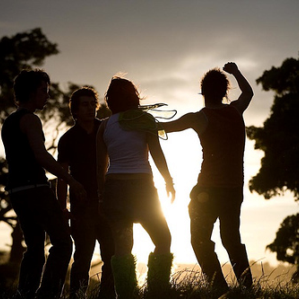

In [51]:
revTrans(inp[11, :, :, :])

In [52]:
turnId2W(true[11, :])

'a group of people standing in front of a setting sun . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>'

In [53]:
turnId2W(pred[11, :])

'a group of people standing together in a setting setting . <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>'

### Beam Search

In [178]:
enc = Encoder(batch_size=1, testing=True)
embs_t = torch.FloatTensor(embs)
dec = Decoder(embs_t)
enc.load_state_dict(torch.load('models/samp_enc.pt'))
dec.load_state_dict(torch.load('models/samp_dec.pt'))

/home/ryanryanadmin/anaconda3/lib/python3.6/site-packages/torchvision-0.1.9-py3.6.egg/torchvision/models/inception.py:65: UserWarning: src is not broadcastable to dst, but they have the same number of elements.  Falling back to deprecated pointwise behavior.
  m.weight.data.copy_(values)


In [214]:
beam_img_path= samp_img_path+'wrap/'+samp_imgs[3];beam_img_path
beam_img = Image.open(beam_img_path); beam_img
beam_img_proc = preproc(beam_img).unsqueeze(0); beam_img_proc.size()

torch.Size([1, 3, 299, 299])

In [215]:
def checkBeam(cands):
    ids = list(map(lambda c: torch.cat(c['i']).data.numpy(), cands))
    prs = list(map(lambda c: c['pr'].data[0], cands))
    caps = map(lambda i: turnId2W(i), ids)
    return list(caps), prs

In [216]:
def beam_search(enc, dec, inp, targ_len=32, beam=2, SOS=SOS, EOS=EOS):
    totSol = []
    long_t = lambda x: Variable(torch.LongTensor(x))
    hidden = enc(Variable(inp)).unsqueeze(0)
    start = {'pr':1.0, 'i': [long_t([SOS])], 'h': hidden}
    cands = [start]
    for ts in range(targ_len):
        temp_cands = []
        for c in cands:
            o, h = dec(c['i'][-1], c['h'])
            top_p, top_i = torch.topk(o, beam)
            for t in range(top_p.size()[1]):    
                tc = {'pr': top_p[:, t] + c['pr'], 'i': c['i'][:] + [top_i[:, t]], 'h': h}
                if tc['i'][-1].data[0] == EOS:
                    totSol.append(tc)
                else:
                    temp_cands.append(tc)
        temp_cands = sorted(temp_cands, key=lambda x: x['pr'].data[0], reverse=True)
        #print(checkBeam(temp_cands))
        cands = temp_cands[:beam]

    all_sol = cands + totSol
    all_sol =  sorted(all_sol, key=lambda x: x['pr'].data[0], reverse=True)
    top_caps, _ = checkBeam(all_sol)
    return all_sol, top_caps
        

In [217]:
o, c = beam_search(enc, dec, beam_img_proc, beam=3)